<a href="https://colab.research.google.com/github/palubad/teaching-cuni/blob/main/GEE_Python_API_Geoinformatika_Wildfire_monitoring.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Author: Daniel Paluba
# EO4Landscape research group (eo4landscape.natur.cuni.cz)
# Department of applied geoinformatics and cartography
# Faculty of Science, Charles University, Prague, Czechia
#
# Copyright 2024 Daniel Paluba
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# **Introduction to the Earth Engine Python API + Wildfire monitoring exercise**

This notebook tutorial gives an introduction to Sentinel-2 imagery with Earth Engine, using the Earth Engine Python [client library](https://github.com/google/earthengine-api) with a focus on wildfire monitoring in Greece.

In [1]:
# import neccessary libraries
import ee                           # Earth Engine
import geemap                       # geemap library
import altair as alt                # for time series visualisation
import pandas as pd                 # for data storage and manipulation
from IPython.display import HTML    # to add custom HTML codes

## **Authentication**

Prior to using the Earth Engine Python client library, you need to authenticate (verify your identity) and use the resultant credentials to initialize the Python client. The following authentication flows should use a Cloud projects to authenticate, and they're used for unpaid (free, noncommercial) use as well as paid use. See the Earth Engine Authentication and Initialization guide for troubleshooting and to learn more.

In [2]:
ee.Authenticate()

## **Initialisation**

The initialization step verifies that valid credentials have been created and populates the Python client library with methods that the backend server supports.

---


**Here, you should add your GEE Cloud Project name.**

In [9]:
# Change PROJECT_NAME to your GEE Cloud Project name
ee.Initialize(project='danielp-cuni')


print('Welcome to the Earth Engine Python API!')

Welcome to the Earth Engine Python API!


In [10]:
# Classic Python printing
print('Welcome to the Earth Engine Python API!')

# GEE Python API printing
print(ee.String('Welcome to the Earth Engine Python API!').getInfo())

Welcome to the Earth Engine Python API!
Welcome to the Earth Engine Python API!


## Working with Earth Engine Python API

*   Import interactive map from the geemap library.
*   Draw a region of interest using the drawing tools.


In [5]:
# define the Map using the geemap library
Map = geemap.Map()

In [6]:
# Import and visualize the Map
Map

# Draw your region of interest (ROI)

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

### Load the drawn region of interest from the Map

In [15]:
# Load the drawn region of interest from the Map
roi = ee.FeatureCollection(Map.draw_features)

# Or define it using Longitude and latitude coordinates
# roi = ee.Geometry.Point([longitude, latitude])

# inspect it
roi

In [ ]:
# Code to remove drawn features from the Map. Uncomment if you want to use it.
# Map.remove_drawn_features()

# Or just remove the last drawing. Uncomment if you want to use it.
# Map.remove_last_drawn()

### Import satellite imagery and filter it

In [16]:
# Filter the Sentinel-2 image collection
dataset = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')# Import data
      .filterBounds(roi)                                    # Spatial filter
      .filterDate('2024-01-01', '2024-11-02')               # Temporal filter
      .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 30))  # Metadata filter
      .sort('CLOUDY_PIXEL_PERCENTAGE'))                     # Sort data

# Print data to the Console
dataset

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


Explore the least cloudy Sentinel-2 image to the Map

In [18]:
dataset.first()

In [19]:
# Add True color RGB composite to the map
Map.addLayer(
    dataset.first(),
    {'min': 0, 'max': 3000, 'bands': 'B4,B3,B2'},
    "S2 Image"
)

Map

Map(bottom=50453.0, center=[38.87179021382536, 24.01611328125], controls=(WidgetControl(options=['position', '…

In [ ]:
# To remove layers from the Map use their names.
# Map.remove("S2 Image")

## Study area - Olympia, Greece
*   the second worst wildfire in Greece history (125,000 hectares burned)
*   largest wildfires are in Attica, Olympia (4.-12.8.2021), Messenia, and the
*   most destructive in northern Euboea
*   Date range: 3 August - 3 September
*   total fires 140+

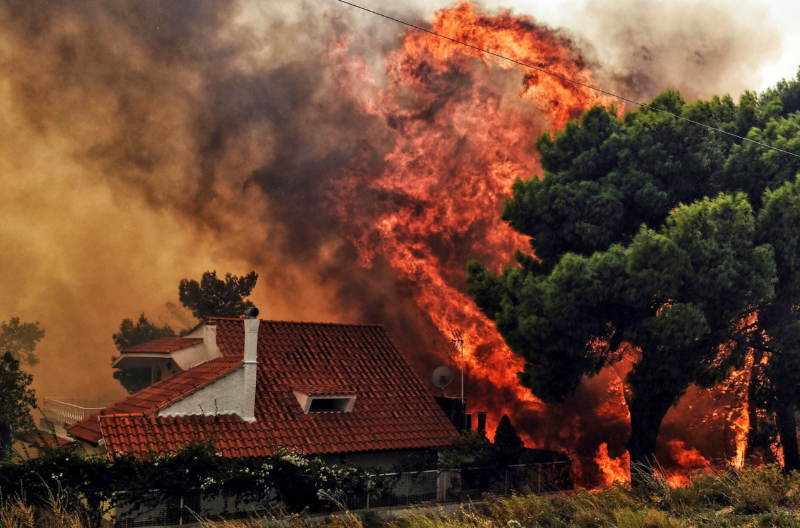







In [20]:
# Import the animated GIF from a Facebook post
HTML('<iframe src="https://www.facebook.com/plugins/video.php?height=476&href=https%3A%2F%2Fwww.facebook.com%2FCopernicusAcademyAUTh%2Fvideos%2F182416847162143%2F&show_text=false&width=476&t=0" width="476" height="476" style="border:none;overflow:hidden" scrolling="no" frameborder="0" allowfullscreen="true" allow="autoplay; clipboard-write; encrypted-media; picture-in-picture; web-share" allowFullScreen="true"></iframe>')

### Define a new region of interest - near Olympia, Greece

In [21]:
# Define the region of interest
burned = ee.Geometry.Polygon(
        [[[21.66448668242632, 37.675104643566485],
          [21.62946776152788, 37.670756736319234],
          [21.652813708793506, 37.641401699488746],
          [21.68714598418413, 37.65771148609171]]]);

## Cloud masking of Sentinel-2 data

### Create a function for cloud masking

In [ ]:
# Function to mask clouds using the Sentinel-2 QA band
def maskS2clouds(image):
    qa = image.select('QA60')

    # Bits 10 and 11 are clouds and cirrus, respectively.
    cloudBitMask = 1 << 10
    cirrusBitMask = 1 << 11

    # Both flags should be set to zero, indicating clear conditions.
    mask = qa.bitwiseAnd(cloudBitMask).eq(0).And(qa.bitwiseAnd(cirrusBitMask).eq(0))

    return image.updateMask(mask)

In [ ]:
# Filter the Sentinel-2 image collection
S2 = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')     # Import data
      .filterBounds(burned)                                 # Spatial filter
      .filterDate('2021-06-01', '2021-10-01')               # Temporal filter
      .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))  # Metadata filter
      .sort('CLOUDY_PIXEL_PERCENTAGE')                      # Sort data
      .map(maskS2clouds)                                    # Mask out clouds
)

# Print data
S2

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


### **BONUS**: create a cloud free composite of Greece using all available images in 2021

In [ ]:
# Load LSIB countries and load the selected one
Greece = ee.FeatureCollection('USDOS/LSIB_SIMPLE/2017').filter(ee.Filter.eq('country_na', 'Greece'))

# Prepare S2 data for greece
S2_Greece = (
       ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')    # Import data
      .filterBounds(Greece)                                 # Spatial filter
      .filterDate('2021-06-01', '2021-10-01')               # Temporal filter
      .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 5))   # Metadata filter
      .sort('CLOUDY_PIXEL_PERCENTAGE')                      # Sort data
      .map(maskS2clouds)                                    # Mask out clouds
)

# Create a median composite and clip it using the Greece feature
cloudfree_greece = S2_Greece.median().clip(Greece)

# Print the size of the dataset used for composite creation
S2_Greece.size()

In [ ]:
# Create a new map for Greece
Greece_map = geemap.Map()

Greece_map.addLayer(Greece,None,'Greece polygon')

# Add it to the map
Greece_map.addLayer(cloudfree_greece,
 {'min': 0, 'max': 3000, 'bands': 'B4,B3,B2'},
 "Cloude free composite for Greece"
)

# Visualise the map
Greece_map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

## Calculate the Normalized Burned Ratio index

In [ ]:
# Function to add NBR index
def addNBR(image):
    return image.addBands(image.normalizedDifference(['B8', 'B12']).rename('NBR'))

# Add it to each image
S2 = S2.map(addNBR)

# Print data
S2

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor


In [ ]:
# define a new map, name it Map2
Map2 = geemap.Map()

In [ ]:
# Add the NBR composite to the Map2
Map2.addLayer(
    S2.first(),
    {'min': -1, 'max': 1, 'bands': 'NBR'},
    "NBR Image"
)

# Add the RGB composite to the Map2
Map2.addLayer(
    S2.first(),
    {'min': 0, 'max': 3000, 'bands': 'B4,B3,B2'},
    "RGB Image"
)

In [ ]:
Map2

Map(bottom=25814.0, center=[36.97622678464096, 21.541442871093754], controls=(WidgetControl(options=['position…

## Compare pre- and post-fire NBRs and Atmospheric Penetration Composites (APC)

In [ ]:
pre_fire_image = S2.filterDate('2021-08-01','2021-08-02').first();
post_fire_image = S2.filterDate('2021-08-16','2021-08-17').first();

Map2.addLayer(pre_fire_image,
            {'min':0,'max':3000,'bands':"B12,B11,B9"},
            "pre_fire_image APC");

Map2.addLayer(pre_fire_image,
            {'min':-1,'max':1,'bands':"NBR"},
            "pre_fire_image NBR Image");

Map2.addLayer(post_fire_image,
            {'min':0,'max':3000,'bands':"B12,B11,B9"},
            "post_fire_image APC");

Map2.addLayer(post_fire_image,
            {'min':-1,'max':1,'bands':"NBR"},
            "post_fire_image NBR Image");

## Calculate the dNBR a visualise the burned areas

In [ ]:
# Calculate the dNBR
dNBR = pre_fire_image.select('NBR').subtract(post_fire_image.select('NBR')).rename('dNBR')

# High and very high burned severity
modAndHighBS = dNBR.gt(0.42);

Map2.addLayer(dNBR,
            {'min':-1,'max':1,'bands':"dNBR"},
            "dNBR Image");

Map2.addLayer(modAndHighBS,
            {'min':-1,'max':1,'bands':"dNBR"},
            "High and very high burned severity");

Map2

Map(bottom=25814.0, center=[36.97622678464096, 21.541442871093754], controls=(WidgetControl(options=['position…

## Create time series plots (a not very nice one)

In [ ]:
# install ipygee
# pip install ipygee

In [ ]:
# import ipygee
import ipygee as ui

In [ ]:
# ## Chart *series*
chart_ts = ui.chart.Image.series(**{
    'imageCollection': S2,
    'region': burned,
    'scale': 10,
    'bands': ['NBR']
})

chart_ts.renderWidget()

HTML(value='<embed src=data:image/svg+xml;charset=utf-8;base64,PD94bWwgdmVyc2lvbj0nMS4wJyBlbmNvZGluZz0ndXRmLTg…

## Create better customizable time series plots (a nice one, but only for advanced Python users)

Codes adopted from [Tyler Erickson's presentation](https://www.youtube.com/watch?v=QBeFNzI2xXI&t=25s) at the Geo For Good 2022 conference.

Create a function that takes the image and creates an `ee.Feature` with the mean and the image timestamp (to help enable timeseries plotting):

In [ ]:
def reduce_region_function(img):
  """Return a feature containing the mean value of a region and a timestamp."""

  stat = img.reduceRegion(
      reducer=ee.Reducer.mean(),
      geometry=burned,
      scale=30
  )
  return ee.Feature(burned, stat).set({'millis': img.date().millis()})

The next two code blocks are helper functions that are used to get the feature properties into a dictionary and then the dictionary values into a pandas dataframe:

In [ ]:
# Define a function to transfer feature properties to a dictionary.
def fc_to_dict(fc):
  prop_names = fc.first().propertyNames()
  prop_lists = fc.reduceColumns(
      reducer=ee.Reducer.toList().repeat(prop_names.size()),
      selectors=prop_names).get('list')

  return ee.Dictionary.fromLists(prop_names, prop_lists)

def fc_to_dataframe(fc):
  """Converts a feature collection to a Pandas dataframe."""
  return pd.DataFrame(fc_to_dict(fc).getInfo())

:Here we apply the helper functions defined above to create a Pandas dataframe:

In [ ]:
stat_fc = (
  ee.FeatureCollection(
    S2.map(reduce_region_function)
  ).filter(
    ee.Filter.notNull(S2.first().bandNames())
  )
)
df = fc_to_dataframe(stat_fc)
df['timestamp'] = pd.to_datetime(df['millis'], unit='ms')
#df.head()

Next we narrow our scope of the feature collection to only focus on the NBR band:

In [ ]:
keys = ['NBR']
source = pd.melt(
    df[['NBR', 'timestamp']],
    id_vars='timestamp',
    value_vars=keys,
    var_name='NBR'
)
source.head()  # display the first few values

,timestamp,NBR,value
0,2021-07-27 09:30:12.155,NBR,0.322657
1,2021-06-27 09:30:10.402,NBR,0.346461
2,2021-08-31 09:30:05.775,NBR,-0.138139
3,2021-08-01 09:30:10.354,NBR,0.313749
4,2021-09-25 09:30:12.330,NBR,-0.097908


Here we use the dataframe to plot the timeseries for NBR:

In [ ]:
alt.Chart(source).mark_line().encode(
    x='timestamp:T',
    y='value',
    color=alt.Color(
        'NBR',
        scale=alt.Scale(
            domain=['NBR'],
            range=['red']
        )
    ),
    tooltip=['NBR', 'value', 'timestamp:T']
).interactive(bind_y=False)

alt.Chart(...)